# Problem set 2 (40 + 36 + 35 = 111 pts)

In this problem set we also present some bonus problems that will be considered as in Problem Set 1.

## Problem 1. Segmentation. (40 pts)
In this task, you will need to solve the problem of semantic segmentation of the attributes of a person's face. You will work with [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. You are free to solve and implement required steps on your own. However, there are several constraints and advices:
- To speed up and simplify experiments, you can transform images to 512x512 resolution and use this [train-test split](https://drive.google.com/file/d/1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI/view?usp=share_link), that has smaller number of images.
- (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model. 
  - (10 pts) Bonus: your own model, not taken from libraries and not a Unet.
- (5 pts) Report IoU and Dice-scores of each class on the test set.
- (5 pts) Try to add augmentations (helpful [link1](https://albumentations.ai/) and [link2](https://kornia.github.io/)).
- (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).
- (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?
- (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?
- Do not use already pretrained on CelebAMask-HQ models.
- **Bonus**: 
  - **+10 points** for top-1 result
  - **+8 points** for 2-3 places
  - **+5 points** for 4-8 places 
according to reported mean Dice score on the provided test split.

## Libraries

In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
import wandb
import torchmetrics

from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.transforms import ToTensor
from tqdm.notebook import tqdm
from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
np.random.seed(42)
torch.manual_seed(42)
warnings.filterwarnings("ignore")
print(torch.cuda.is_available())

True


## Configuration

In [10]:

config = {
    'batch_size': 5,
    'num_epoch': 10,
    'learning_rate': 1e-3,
    'num_classes': 19,
    'num_channels': 3
}

label_list = [
              'emptiness', 'skin', 'nose', 'eye_g', 'l_eye', 'r_eye',
              'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip',
              'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth'
]

## Dataset and Dataloaders

In [3]:
root = os.getcwd()

In [4]:

class MyDataset(Dataset):
    def __init__(self, root, transform=None, train=True):
        self.root = root
        self.transform = transform
        self.train = train
        
        self.img_dir = os.path.join(root, "CelebAMask-HQ/CelebA-HQ-img")
        self.mask_dir = os.path.join(root, "CelebAMask-HQ/CelebAMask-HQ-mask")
        self.csv_path = os.path.join(root, "CelebAMask-HQ/celeb_train_test_split.csv")
        
        # Read the CSV file and filter by train/test split
        with open(self.csv_path, 'r') as f:
            lines = f.readlines()
        
        if train:
            self.data = [line.split(',')[0] for line in lines if line.split(',')[1].strip() == 'True']
        else:
            self.data = [line.split(',')[0] for line in lines if line.split(',')[1].strip() == 'False']
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        # Load the image and mask at the given index
        img_path = os.path.join(self.img_dir, self.data[index])
        mask_path = os.path.join(self.mask_dir, self.data[index].replace(".jpg", ".png"))
        image = Image.open(img_path)
        mask = Image.open(mask_path).convert('L')
        
        # Apply the transforms
        if self.transform is not None:
            image = self.transform(image)
            mask = self.transform(mask) * 255

        return image, mask
    

In [5]:

batch_size = config['batch_size']

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    ToTensor(),
])

train_dataset_full = MyDataset(root=root, transform=transform, train=True)
train_dataset, val_dataset = train_test_split(train_dataset_full, test_size=0.2, random_state=42)

test_dataset = MyDataset(root=root, transform=transform, train=False)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


## Display the images from the loader

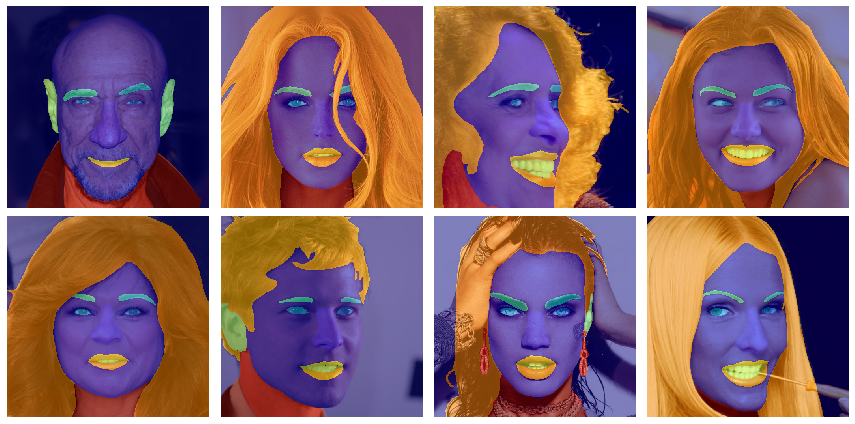

In [6]:

# Get a batch of normalized images and masks from the train loader
train_loader_disp = DataLoader(train_dataset, batch_size=8, shuffle=True)
images, masks = next(iter(train_loader_disp))

# Convert the tensors to numpy arrays
image_array = images.numpy()
mask_array = masks.numpy()

image_array = image_array

# Create a grid of unnormalized images and masks
num_samples = image_array.shape[0]
num_cols = 4
num_rows = int(np.ceil(num_samples / num_cols))
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 3*num_rows))
for i in range(num_rows):
    for j in range(num_cols):
        k = i * num_cols + j
        if k < num_samples:
            axs[i, j].imshow(np.transpose(image_array[k], (1, 2, 0)))
            axs[i, j].imshow(mask_array[k][0], alpha=0.5, cmap='jet')
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()


## Model Architecture

In [7]:

class Encoder_Block(torch.nn.Module):
  def __init__(self,inp_channels,out_channels):
    super().__init__()
    self.model = torch.nn.Sequential(
        torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
    )
    self.pooling = torch.nn.MaxPool2d(2)
  def forward(self,x):
    int_out = self.model(x)
    return self.pooling(int_out), int_out

class Decoder_Block(torch.nn.Module):
  def __init__(self,inp_channels,out_channels):
    super().__init__()
    self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
    self.model = torch.nn.Sequential(
        torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
    )
  def forward(self,x,enc_x):
    x = self.upsample(x)
    x = torch.cat([x,enc_x],dim=1)
    return self.model(x)


### Check

In [8]:

enc = Encoder_Block(64,128)
dec = Decoder_Block(256,128)
inp = torch.randn(1,64,64,64)
x,enc_x = enc(inp)

assert x.shape == (1,128,32,32), "correct encoder implementation"

inp = torch.randn(1,256,32,32)
x = dec(inp,enc_x)

assert x.shape == (1,128,64,64), "correct decoder implementation"


In [9]:

class Unet(torch.nn.Module):
  def __init__(self,inc,outc,hidden_size=64):
    super().__init__()
    self.Encoder = torch.nn.ModuleList([
        Encoder_Block(inc,hidden_size),
        Encoder_Block(hidden_size,hidden_size*2),
        Encoder_Block(hidden_size*2,hidden_size*4),
        Encoder_Block(hidden_size*4,hidden_size*8),
    ])
    self.bottleneck = torch.nn.Sequential(
        torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
        torch.nn.BatchNorm2d(hidden_size*16),
        torch.nn.ReLU(),
        torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
        torch.nn.BatchNorm2d(hidden_size*16),
        torch.nn.ReLU()
    )
    self.Decoder = torch.nn.ModuleList([
        Decoder_Block(hidden_size*16,hidden_size*8),
        Decoder_Block(hidden_size*8,hidden_size*4),
        Decoder_Block(hidden_size*4,hidden_size*2),
        Decoder_Block(hidden_size*2,hidden_size*1),
    ])
    self.last_layer = torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same")
  def forward(self,x):
    enc_xs = []
    for module in self.Encoder:
      x, enc_x= module(x)
      enc_xs.append(enc_x)
    
    enc_xs = enc_xs[::-1]
    x = self.bottleneck(x)

    for i,module in enumerate(self.Decoder):
      x = module(x,enc_xs[i])
    return self.last_layer(x)


### Check

In [10]:

unet = Unet(3,19)
assert unet(torch.randn(1,3,128,128)).shape == (1,19,128,128), "check your implementation"


## Metrics

In [11]:
def IoU_Dice(num_classes, outputs, masks, total_iou, total_dice):
    
    iou_list = []
    dice_list = []
    for i in range(num_classes):
        mask_pred = (outputs.argmax(dim=1) == i).float()
        mask_true = (masks == i).float()
        
        intersection = (mask_pred * mask_true).sum()
        union = (mask_pred + mask_true).sum()
        
        iou = intersection / union if union > 0 else torch.tensor(1.0)
        dice = (2 * intersection) / (mask_pred.sum() + mask_true.sum()) if (mask_pred.sum() + mask_true.sum()) > 0 else torch.tensor(1.0)
        
        iou_list.append(iou.item())
        dice_list.append(dice.item())
        total_iou[i] += iou
        total_dice[i] += dice
    
    return total_iou, total_dice, iou_list, dice_list


## Train and Test Loop

In [12]:

# Define the training loop
def train_loop(model, criterion, optimizer, verbose = True):
    
    model.train()
    stream_run = tqdm(train_loader)
    for images, masks in stream_run:
        images = images.to(device)
        masks = masks.to(device, dtype=torch.int64).squeeze(1)
        
        outputs = model(images)

        loss = criterion(outputs, masks)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        stream_run.set_description(f'Train Loss per batch: {loss.item():.4f}')
        if verbose:
            wandb.log({"Train_loss_per_batch": loss.item()}) # Log the loss every batch
    

# Define the validation loop
def val_loop(model, criterion):
    
    model.eval()
    total_loss = 0.0
    total_iou = torch.zeros(config['num_classes']).to(device)
    total_dice = torch.zeros(config['num_classes']).to(device)
    with torch.no_grad():
        
        stream_run = tqdm(val_loader)
        for images, masks in stream_run:
            images = images.to(device)         
            masks = masks.to(device, dtype=torch.int64).squeeze(1)
            
            outputs = model(images)
            
            loss = criterion(outputs, masks)
            total_loss += loss.item()
            
            total_iou, total_dice, _, _ = IoU_Dice(config['num_classes'], outputs, masks, total_iou, total_dice)
            
            stream_run.set_description(f'Val Loss per batch: {loss.item():.4f}')
            
    avg_loss = total_loss / len(val_loader)
    avg_iou = total_iou / len(val_loader)
    avg_dice = total_dice / len(val_loader)
    
    return avg_loss, avg_iou, avg_dice

     
# Define the test loop
def test_loop(model, criterion):
    
    model.eval()
    total_loss = 0.0
    total_iou = torch.zeros(config['num_classes']).to(device)
    total_dice = torch.zeros(config['num_classes']).to(device)
    iou_ls, dice_ls = [], []
    with torch.no_grad():
        
        stream_run = tqdm(test_loader)
        for images, masks in stream_run:
            images = images.to(device)         
            masks = masks.to(device, dtype=torch.int64).squeeze(1)
            
            outputs = model(images)
            
            loss = criterion(outputs, masks)
            total_loss += loss.item()
            
            total_iou, total_dice, iou_list, dice_list = IoU_Dice(config['num_classes'], outputs, masks, total_iou, total_dice)
            iou_ls.append(iou_list)
            dice_ls.append(dice_list)
            
            stream_run.set_description(f'Test Loss per batch: {loss.item():.4f}')
            
    avg_loss = total_loss / len(test_loader)
    avg_iou = total_iou / len(test_loader)
    avg_dice = total_dice / len(test_loader)
    
    print(f'Test Loss: {avg_loss:.4f}, Test IoU: {avg_iou.mean().item():.4f}, Test Dice: {avg_dice.mean().item():.4f}')
    
    return iou_ls, dice_ls


## Training

In [13]:

model = Unet(config['num_channels'],config['num_classes']).to(device)
criterion = torch.nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])


In [14]:

wandb.init(project='Celeba_experiment_1', entity='nickcalmykow281')
wandb.config.update({"learning_rate": config['learning_rate'], "batch_size": config['batch_size']})

# Train the model
for epoch in range(config['num_epoch']):
    train_loop(model, criterion, optimizer)
    val_loss, val_iou, val_dice = val_loop(model, criterion)

    wandb.log({"epoch": epoch, "val_loss": val_loss, "val_iou": val_iou.mean().item(), "val_dice": val_dice.mean().item()})
    
# Save the final model
torch.save(model.state_dict(), "final_model.pth")


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nickcalmykow281. Use `wandb login --relogin` to force relogin


  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

## Test. IoU and Dice-scores for each class

In [16]:
model = Unet(config['num_channels'],config['num_classes']).to(device)
# Load the saved model state dictionary
model.load_state_dict(torch.load("final_model.pth"))

<All keys matched successfully>

In [17]:
iou_ls, dice_ls = test_loop(model, criterion)

  0%|          | 0/250 [00:00<?, ?it/s]

Test Loss: 0.3327, Test IoU: 0.3879, Test Dice: 0.7147


In [14]:
def metrics_each(iou_ls, dice_ls, label_list):

    iou_ls_av, dice_ls_av = [], []
    
    for i in range(len(iou_ls[0])):
        total_i, total_d = 0, 0
        for lst_i, lst_d in zip(iou_ls, dice_ls):
            total_i += lst_i[i]
            total_d += lst_d[i]
            
        avg_i = total_i / len(iou_ls)
        iou_ls_av.append(avg_i)
        avg_d = total_d / len(dice_ls)
        dice_ls_av.append(avg_d)
        
    data = {'Attributes': label_list, 'IoU': iou_ls_av, 'Dice': dice_ls_av}
    df = pd.DataFrame(data)
    df['IoU'], df['Dice'] = df['IoU'].round(2), df['Dice'].round(2) 

    return df

In [19]:
df = metrics_each(iou_ls, dice_ls, label_list)
df

,Attributes,IoU,Dice
0,emptiness,0.45,0.90
1,skin,0.47,0.93
2,nose,0.44,0.87
3,eye_g,0.31,0.39
4,l_eye,0.40,0.80
5,r_eye,0.39,0.79
6,l_brow,0.38,0.77
7,r_brow,0.38,0.76
8,l_ear,0.35,0.70
9,r_ear,0.34,0.67


## Description of experiments

I used the `U-Net architecture` because it's particularly effective for segmentation tasks where the objects of interest are small. The Encoder_Block and Decoder_Block modules define the contracting and expanding paths, respectively, and the Unet module puts them together to form the U-Net architecture.

The IoU metric measures the overlap between the predicted segmentation mask and the ground truth mask, while the Dice coefficient is the harmonic mean of precision and recall. Higher values of IoU and Dice indicate better segmentation performance.

`My results` show that the model is performing `well` on some classes, such as `skin, nose, and hair`, with IoU and Dice scores above 0.80. However, for some other classes, such as `ear_r and hat`, the model's performance is relatively `low`.

You can find the training in this WANDB Link https://wandb.ai/nickcalmykow281/Celeba_experiment_1/runs/ugi84ze7?workspace=user-nickcalmykow281

## Examples of obtained results on the test

In [20]:
imgs, targs = next(iter(test_loader))
imgs, targs = imgs.to(device), targs.to(device)
    
model.eval()
preds = model(imgs).argmax(1)

In [21]:
targs[0][0].shape

torch.Size([512, 512])

In [22]:
imgs.shape

torch.Size([5, 3, 512, 512])

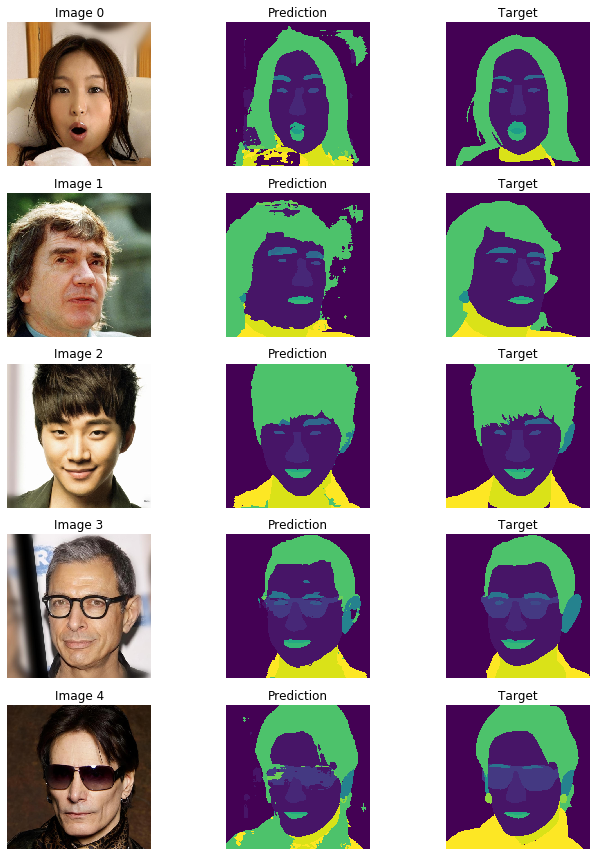

In [23]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 12))
for i in range(5):
    for j in range(3):
        if j == 0:
            axes[i, j].imshow(imgs[i].permute(1,2,0).cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Image {}'.format(i))
        elif j == 1:
            axes[i, j].imshow(preds[i].cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Prediction')
        else:
            axes[i, j].imshow(targs[i][0].cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Target')
plt.tight_layout()
plt.show()


In [24]:
def func(model, image_path):
    # Define the transform for the input image
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor()
    ])

    # Load the input image
    image = Image.open(image_path)

    # Plot the initial image
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Initial Image')

    # Transform the image and pass it through the model
    image_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(image_tensor)
        outputs = outputs.argmax(1).squeeze(0)
        predicted_image = outputs.cpu()

    # Plot the predicted image
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.axis('off')
    plt.title('Predicted Image')

    # Save the figure
    plt.savefig("predicted_image.png", bbox_inches="tight", pad_inches=0)
    plt.show()


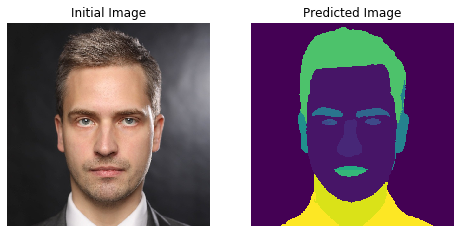

In [25]:
img_path = os.path.join(root, 'My_picture_1.jpg')
func(model, img_path)

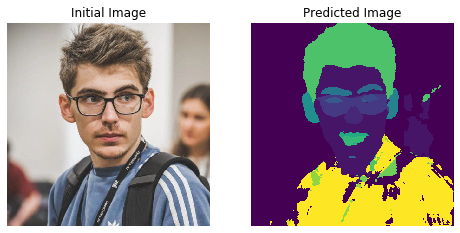

In [26]:
img_path = os.path.join(root, 'My_picture_2.jpg')
func(model, img_path)

The model works well enough on the new data.

## Add Augmentations

In [15]:

class MyDataset(Dataset):
    def __init__(self, root, transform=None, transform_mask=None, train=True):
        self.root = root
        self.transform = transform
        self.transform_mask = transform_mask
        self.train = train
        
        self.img_dir = os.path.join(root, "CelebAMask-HQ/CelebA-HQ-img")
        self.mask_dir = os.path.join(root, "CelebAMask-HQ/CelebAMask-HQ-mask")
        self.csv_path = os.path.join(root, "CelebAMask-HQ/celeb_train_test_split.csv")
        
        # Read the CSV file and filter by train/test split
        with open(self.csv_path, 'r') as f:
            lines = f.readlines()
        
        if train:
            self.data = [line.split(',')[0] for line in lines if line.split(',')[1].strip() == 'True']
        else:
            self.data = [line.split(',')[0] for line in lines if line.split(',')[1].strip() == 'False']
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        # Load the image and mask at the given index
        img_path = os.path.join(self.img_dir, self.data[index])
        mask_path = os.path.join(self.mask_dir, self.data[index].replace(".jpg", ".png"))
        image = Image.open(img_path)
        mask = Image.open(mask_path).convert('L')
        
        # Apply the transforms
        if self.transform is not None:
            image = self.transform(image)
            mask = self.transform_mask(mask) * 255

        return image, mask
    

In [16]:

transform_train = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.GaussianBlur(7),
    transforms.ColorJitter(),
    ToTensor(),
])

transform_mask = transforms.Compose([
    transforms.Resize((512, 512)),
    ToTensor()
])

transform_test = transforms.Compose([
    transforms.Resize((512, 512)),
    ToTensor()
])

train_dataset_full = MyDataset(root=root, transform=transform_train, transform_mask=transform_mask, train=True)
train_dataset, val_dataset = train_test_split(train_dataset_full, test_size=0.2, random_state=42)

test_dataset = MyDataset(root=root, transform=transform_test, transform_mask=transform_mask, train=False)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [18]:

# Train the model
for epoch in range(config['num_epoch']):
    train_loop(model, criterion, optimizer, verbose=False)
    val_loss, val_iou, val_dice = val_loop(model, criterion)
 
# Save the final model
torch.save(model.state_dict(), "final_model_augm.pth")


  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/600 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

In [19]:
model = Unet(config['num_channels'],config['num_classes']).to(device)

# Load the saved model state dictionary
model.load_state_dict(torch.load("final_model_augm.pth"))

<All keys matched successfully>

In [21]:
iou_ls, dice_ls = test_loop(model, criterion)

  0%|          | 0/250 [00:00<?, ?it/s]

Test Loss: 0.3625, Test IoU: 0.3527, Test Dice: 0.6567


In [22]:
df = metrics_each(iou_ls, dice_ls, label_list)
df

,Attributes,IoU,Dice
0,emptiness,0.45,0.89
1,skin,0.46,0.92
2,nose,0.44,0.87
3,eye_g,0.07,0.11
4,l_eye,0.33,0.66
5,r_eye,0.37,0.74
6,l_brow,0.37,0.74
7,r_brow,0.37,0.74
8,l_ear,0.34,0.68
9,r_ear,0.34,0.67


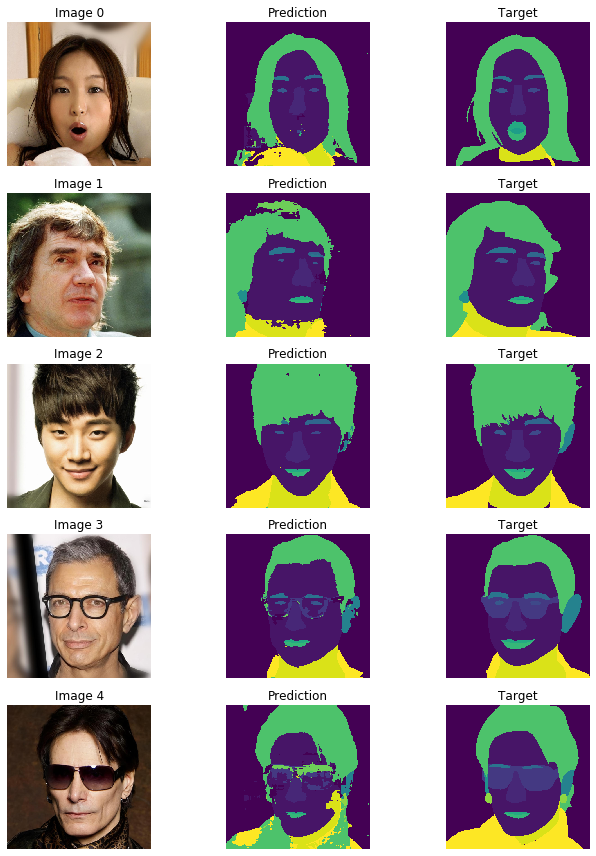

In [23]:
imgs, targs = next(iter(test_loader))
imgs, targs = imgs.to(device), targs.to(device)
    
model.eval()
preds = model(imgs).argmax(1)

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(10, 12))
for i in range(5):
    for j in range(3):
        if j == 0:
            axes[i, j].imshow(imgs[i].permute(1,2,0).cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Image {}'.format(i))
        elif j == 1:
            axes[i, j].imshow(preds[i].cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Prediction')
        else:
            axes[i, j].imshow(targs[i][0].cpu())
            axes[i, j].axis('off')
            axes[i, j].set_title('Target')
plt.tight_layout()
plt.show()


The reduction in Intersection over Union (IoU) and Dice score after applying data augmentations such as `GaussianBlur(7)` and `ColorJitter()` could be due to several reasons: over-augmentation, the augmentations not suitable for this dataset, etc.

## Problem 2. Deep image prior (36 pts)

In the deep prior framework, we aim to learn a prior distribution over the parameters $\theta$ of a generative model such that, given some observation $\hat{y}$, we can sample a plausible output $y$ from the learned prior distribution. The goal is to learn a posterior distribution $p(z,\theta|\hat{y})$ over the latent variable $z$ and the parameters $\theta$ such that, given some observation $\hat{y}$ (e.g., an image of a face), we can sample a plausible latent variable $z$ and generate a corresponding output image $y= f_\theta(z)$ that is similar to the observation. The conditional distribution of $y$ given $\hat{y}$ can be written as an integral over $z$ and $\theta$:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(z,\theta|\hat{y})dzd\theta$$

Unfortunately, in practice, it is difficult to compute this integral exactly, since we don't know the conditional distribution $p(y|z,\theta,\hat{y})$ and the posterior distribution $p(z,\theta|\hat{y})$. Instead, we can use an optimization approach to learn the prior distribution $p(z,\theta)$ and the network $f_\theta(z)$ that best approximate the true conditional distribution.

Specifically, we first assume that the latent variable $z$ is independent of the observation $\hat{y}$, i.e., $p(z,\theta|\hat{y}) = p(\theta|\hat{y})p(z)$. This allows us to rewrite the conditional distribution of $y$ as:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Next, we use an optimization approach to learn the parameters $\theta$ of the network to minimize the expected distance between the generated output $y=f_\theta(z)$ and the observation $\hat{y}$:

$$\min_\theta E(f_\theta(z),\hat{y})$$

To perform this optimization, we can apply a stochastic gradient descent approach where we sample random values of $z$ from the prior distribution $p(z)$ and compute the gradients of the loss function with respect to $\theta$ using backpropagation. This way, we can iteratively update the parameters of the network to improve its ability to generate realistic outputs given the observed data.

This approach is used to perform denoising, inpainting and super resolution. The basic architecture for the task is UNet, which we will use in our experiments.

## Implementation

In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import gdown
import seaborn as sns
torchvision.utils
from torch.optim import Adam
from torchvision import transforms
from tqdm import tqdm
from PIL import Image
from torchmetrics import TotalVariation as TV

print(torch.cuda.is_available())

True


In [2]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc_x):
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)

In [3]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
# sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
# gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
# !unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /home/orogov/Kalmykov/DL/HW_2/data.zip
100%|██████████| 1.60M/1.60M [00:00<00:00, 14.2MB/s]


Archive:  ./data.zip
   creating: data/
   creating: data/denoising/
  inflating: data/denoising/F16_GT.png  
  inflating: data/denoising/snail.jpg  
   creating: data/inpainting/
  inflating: data/inpainting/kate.png  
  inflating: data/inpainting/kate_mask.png  
  inflating: data/inpainting/library.png  
  inflating: data/inpainting/library_mask.png  
  inflating: data/inpainting/vase.png  
  inflating: data/inpainting/vase_mask.png  


In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [6]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

## Your work starts here

In [7]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

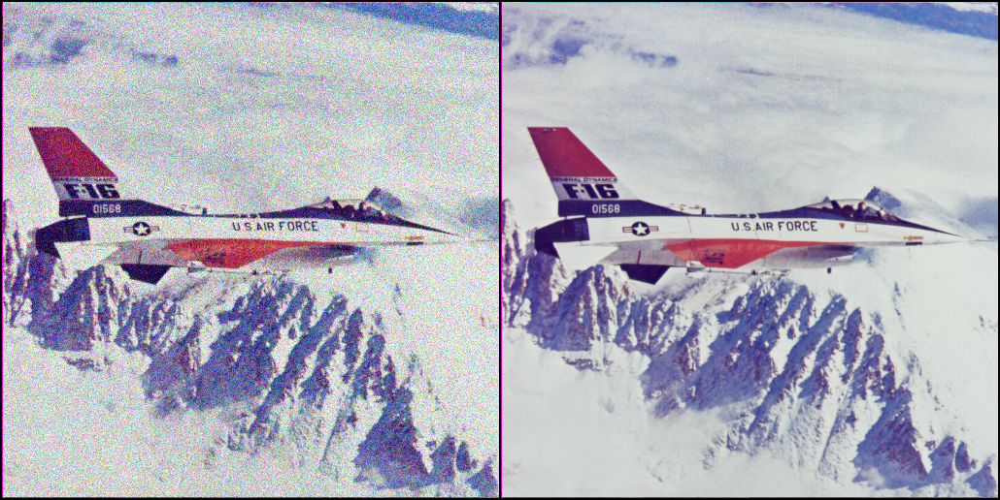

In [8]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [10]:

def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):

    optimizer = Adam(model.parameters(), lr=1e-4)
    
    loss_ls, loss_orig_ls = [], []
    
    stream_run = tqdm(range(iters))
    for i in stream_run:     
        # add noise to input img
        img = z + reg_noise * torch.randn(z.shape).to(z.device)
        
        output = model(img)
        
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        
        loss_ls.append(loss.item())
        loss_orig_ls.append(loss_orig.item())
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
            
    return z, loss_ls, loss_orig_ls


### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [11]:

model = Unet(inc = 32, outc = 3, hidden_size=16).to(device)
 
z = torch.empty((1, 32, img.size(2), img.size(3)),
                device=device).normal_(mean=0, std=0.1).requires_grad_(True)

iters = 3000

# Train the model
z, loss_ls, loss_orig_ls = optimization(model, z, corrupted_img, img, iters) 


100%|██████████| 3000/3000 [08:56<00:00,  5.60it/s]


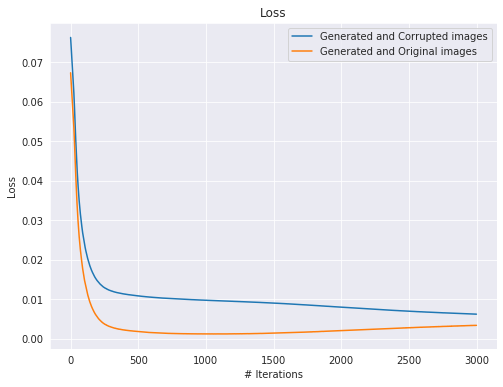

In [31]:
sns.set_style('darkgrid')

# plot the data using sns.lineplot
plt.figure(figsize=(8, 6))
sns.lineplot(x=range(len(loss_ls)), y=loss_ls, label='Generated and Corrupted images')
sns.lineplot(x=range(len(loss_orig_ls)), y=loss_orig_ls, label='Generated and Original images')
plt.legend()
plt.title('Loss')
plt.xlabel('# Iterations')
plt.ylabel('Loss')
plt.show()

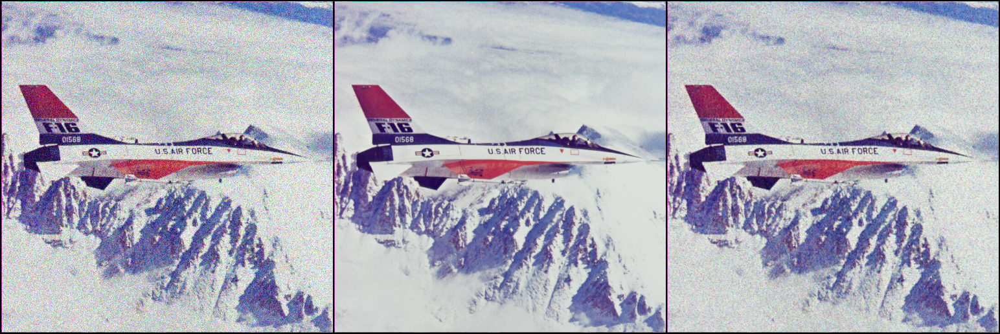

In [27]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model(z.to(device))],dim=0),nrow=3,normalize=True))

From the graphs, we can see that the corrupted image (`1`) is more different from the original image (`2`) than the generated image (`3`): if the corrupted image has a lot of noise or artifacts, it may be more dissimilar to the original image than the denoised image. As a result, the generated image may have a lower loss when compared to the original image than when compared to the corrupted image. However, we need to find the optimal number of iterations to avoid the overfitting.

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step

In [9]:

def Total_Variation_metric(img, weight=1.):
     # Get the dimensions of the input image
     batch_size, channels, height, width = img.size()
     
     # Calculate the sum of the squared differences between adjacent pixels
     tv_h = torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum()
     tv_w = torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum()

     return weight * (tv_h + tv_w) / (batch_size * channels * height * width)


In [10]:

def optimization_modified(model,z,noised_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    #duplicate your previous code and stop optimization according to stopping criteria
    
    optimizer = Adam(model.parameters(), lr=1e-4)
    
    loss_ls, loss_orig_ls, tv_list_f = [], [], []
    stream_run = tqdm(range(iters))
    for i in stream_run:
        # add noise to input img
        img = z + reg_noise * torch.randn(z.shape).to(z.device)
        
        output = model(img)
        
        tv_measure = Total_Variation_metric(output)
        
        tv_list_f.append(tv_measure.item())
        
        if (np.mean(tv_list_f[:-10]) if len(tv_list_f) > 10 else np.mean(tv_list_f)) < tv_measure:
            break
        
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        
        loss_ls.append(loss.item())
        loss_orig_ls.append(loss_orig.item())
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
            
    return z, loss_ls, loss_orig_ls, tv_list_f


In [34]:

model = Unet(inc = 32, outc = 3, hidden_size=16).to(device)

z = torch.empty((1, 32, img.size(2), img.size(3)),
                device=device).normal_(mean=0, std=0.1).requires_grad_(True)

z, loss_ls, loss_orig_ls, tv_list_f = optimization_modified(model, z, corrupted_img, img, iters)


 40%|███▉      | 1197/3000 [03:37<05:26,  5.51it/s]


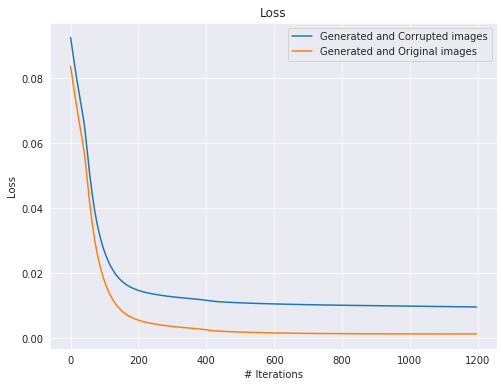

In [35]:

sns.set_style('darkgrid')

# plot the data using sns.lineplot
plt.figure(figsize=(8, 6))
sns.lineplot(x=range(len(loss_ls)), y=loss_ls, label='Generated and Corrupted images')
sns.lineplot(x=range(len(loss_orig_ls)), y=loss_orig_ls, label='Generated and Original images')
plt.legend()
plt.title('Loss')
plt.xlabel('# Iterations')
plt.ylabel('Loss')
plt.show()


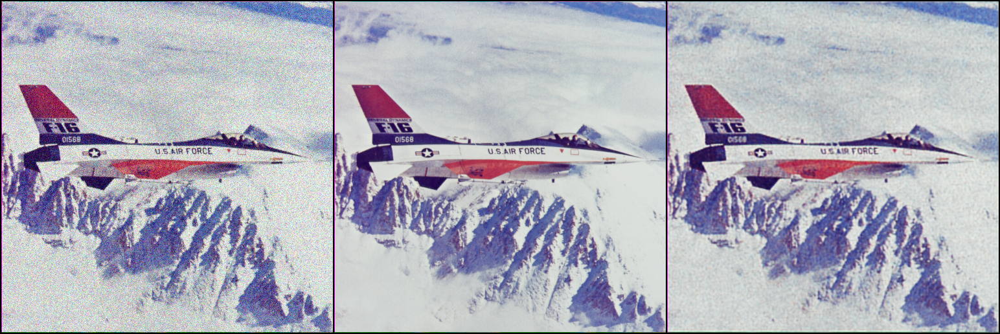

In [36]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model(z.to(device))],dim=0),nrow=3,normalize=True))

The optimal number of iterations is about 1000.

## Stochastic gradient Langevin dynamics (SGLD) optimization 

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [11]:

def SGLD(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01, strength = 4):

    optimizer = Adam(model.parameters(), lr=1e-4)
    
    loss_ls, loss_orig_ls = [], []
    
    stream_run = tqdm(range(iters)) 
    for i in stream_run:       
        # add noise to input img
        img = z + reg_noise * torch.randn(z.shape).to(z.device)
        
        output = model(img)
        
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        
        loss_ls.append(loss.item())
        loss_orig_ls.append(loss_orig.item())
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            for module in model.modules():
                if type(module) == torch.nn.Conv2d:
                    noise = 1e-4 * strength * torch.randn_like(module.weight.data)
                    module.weight.add_(noise)              
            
    return z, loss_ls, loss_orig_ls


In [38]:

model = Unet(inc = 32, outc = 3, hidden_size=16).to(device)

z = torch.empty((1, 32, img.size(2), img.size(3)),
                device=device).normal_(mean=0, std=0.1).requires_grad_(True)

z, loss_ls, loss_orig_ls = SGLD(model, z, corrupted_img, img, iters)
 

100%|██████████| 3000/3000 [09:03<00:00,  5.52it/s]


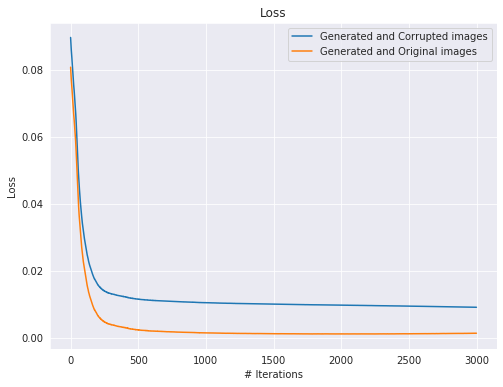

In [39]:

sns.set_style('darkgrid')

# plot the data using sns.lineplot
plt.figure(figsize=(8, 6))
sns.lineplot(x=range(len(loss_ls)), y=loss_ls, label='Generated and Corrupted images')
sns.lineplot(x=range(len(loss_orig_ls)), y=loss_orig_ls, label='Generated and Original images')
plt.legend()
plt.title('Loss')
plt.xlabel('# Iterations')
plt.ylabel('Loss')
plt.show()


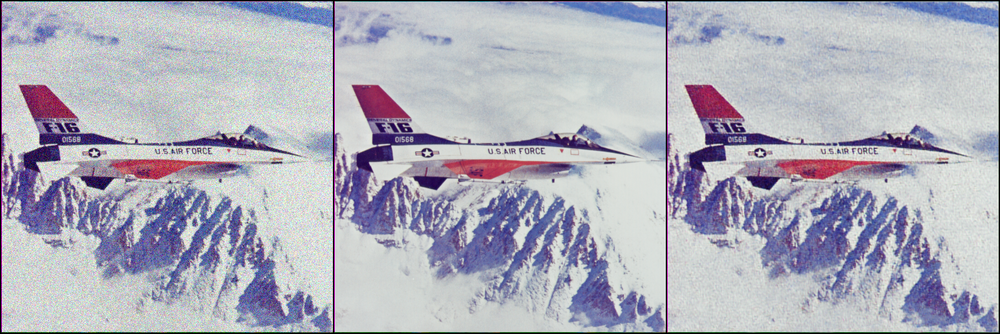

In [40]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model(z.to(device))],dim=0),nrow=3,normalize=True))

I experimented with different values of $s=1,4,8$. Lower values of $s$ may result in slower convergence, while higher values of $s$ may result in faster convergence, but at the risk of producing unstable results.

It is important to strike a balance between the strength of the noise and the stability of the optimization process.

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part. 

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [12]:

class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        
        # Define convolutional layers for skip and x inputs
        self.conv_skip = torch.nn.Conv2d(skip_channels, skip_channels, kernel_size=2, stride=2)
        self.conv_x = torch.nn.Conv2d(x_channels, skip_channels, kernel_size=1)
        
        # Define activation functions
        self.relu = torch.nn.ReLU()
        self.sigmoid = torch.nn.Sigmoid()

        # Define convolutional layer to reduce feature maps to a single attention map
        self.conv_reduce = torch.nn.Conv2d(skip_channels, 1, kernel_size=1)

        # Define upsampling layer to resize attention map to the size of skip input
        self.upsample = torch.nn.Upsample(scale_factor=2, mode='nearest')

    def forward(self,skip,x):
        
        skip_input = skip.clone()

        # Downsample skip input and transform x input
        skip_resized = self.conv_skip(skip)
        x_transformed = self.conv_x(x)

        # Combine skip and x inputs and apply ReLU activation function
        combined = self.relu(skip_resized + x_transformed)
        
        attention = self.sigmoid(self.conv_reduce(combined))
        attention_upsampled = self.upsample(attention)

        skip_attention = skip_input * attention_upsampled

        return skip_attention


In [13]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [14]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [15]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

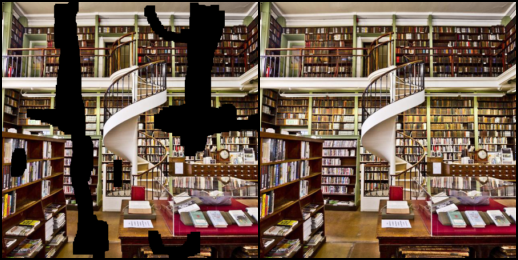

In [16]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

In [17]:

def optimization_inpainting(model,z,corrupted_img,mask,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.2,s=4,lr=4e-4):
    
    optimizer = Adam(model.parameters(), lr=lr)
    
    loss_ls, loss_orig_ls = [], []
    
    stream_run = tqdm(range(iters))
    for i in stream_run:
        img = z + reg_noise * torch.randn(z.shape).to(z.device)

        output = model(img)
        output = output * mask
        
        loss = criterion(output, corrupted_img)
        loss_orig = criterion(output, orig_img)
        
        loss_ls.append(loss.item())
        loss_orig_ls.append(loss_orig.item())
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            for module in model.modules():
                if type(module) == torch.nn.Conv2d:
                    noise = lr * s * torch.randn_like(module.weight.data)
                    module.weight.add_(noise)              
            
    return z, output, loss_ls, loss_orig_ls


### Model without attention

In [53]:

nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)


In [54]:

iters = 2000
z, output, loss_ls, loss_orig_ls = optimization_inpainting(model_without_attention,z,corrupted_img,img_mask,img,iters) 


100%|██████████| 2000/2000 [01:20<00:00, 24.72it/s]


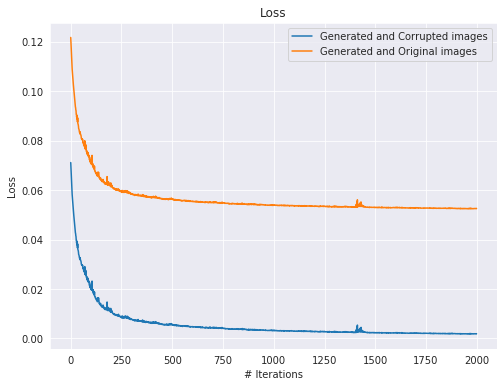

In [55]:

sns.set_style('darkgrid')

# plot the data using sns.lineplot
plt.figure(figsize=(8, 6))
sns.lineplot(x=range(len(loss_ls)), y=loss_ls, label='Generated and Corrupted images')
sns.lineplot(x=range(len(loss_orig_ls)), y=loss_orig_ls, label='Generated and Original images')
plt.legend()
plt.title('Loss')
plt.xlabel('# Iterations')
plt.ylabel('Loss')
plt.show()


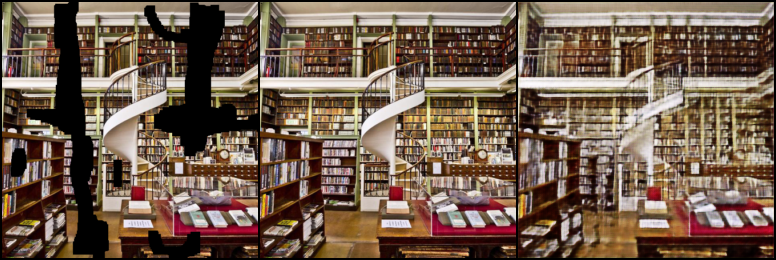

In [56]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model_without_attention(z.to(device))],dim=0),nrow=3,normalize=True))

### Model with attention

In [58]:

nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

iters = 2000
z, out, loss_ls, loss_orig_ls = optimization_inpainting(model_with_attention,z,corrupted_img,img_mask,img,iters) 


100%|██████████| 2000/2000 [01:41<00:00, 19.70it/s]


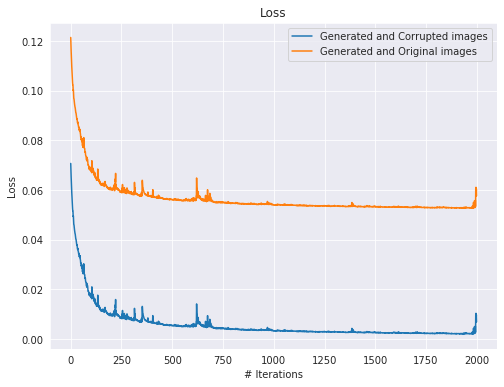

In [59]:

sns.set_style('darkgrid')

# plot the data using sns.lineplot

sns.lineplot(x=range(len(loss_ls)), y=loss_ls, label='Generated and Corrupted images')
sns.lineplot(x=range(len(loss_orig_ls)), y=loss_orig_ls, label='Generated and Original images')
plt.legend()
plt.title('Loss')
plt.xlabel('# Iterations')
plt.ylabel('Loss')
plt.show()


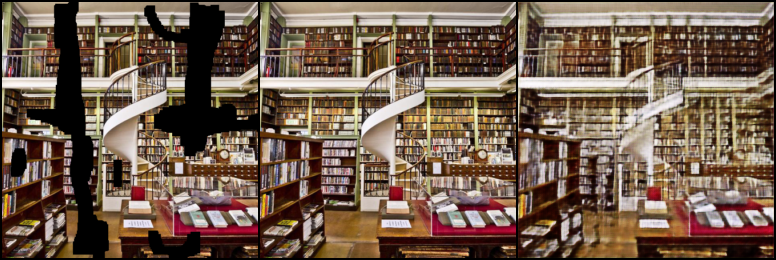

In [60]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,model_without_attention(z.to(device))],dim=0),nrow=3,normalize=True))

From the plots, we can see that both the `AttentionUNet` and the standard `UNet` models are able to generate plausible inpainted images. The `AttentionUNet` model has a slight advantage over the standard UNet model in terms of the loss convergence rate (the loss curves for the AttentionUNet model are steeper than those for `UNet` model). However, the performance difference between the two models is relatively small, and may not be significant in practice.

## Bonus Task. Optimal Hyperparameters

100%|██████████| 2000/2000 [01:00<00:00, 32.95it/s]


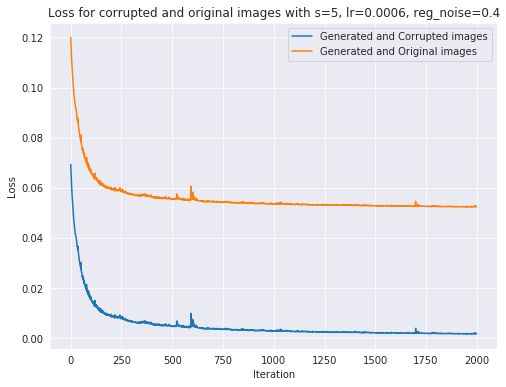

In [22]:

nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

iters = 2000

# create the figure and axis objects outside the loop
fig, ax = plt.subplots(figsize=(8, 6))

for i, s in enumerate([4,5]):
    for j, lr in enumerate([2e-4, 4e-4,6e-4]): 
        for k, reg_noise in enumerate([0.02, 0.2, 0.4]): 
            # run optimization
            z, out, loss_ls, loss_orig_ls = optimization_inpainting(model_with_attention,z,corrupted_img,img_mask,img,iters)
            
            # update the plot data
            ax.set_title(f"Loss for corrupted and original images with s={s}, lr={lr}, reg_noise={reg_noise}")
            ax.set_xlabel('Iteration')
            ax.set_ylabel('Loss')
            ax.plot(loss_ls, label='Generated and Corrupted images')
            ax.plot(loss_orig_ls, label='Generated and Original images')
            ax.legend()
            fig.canvas.draw()
            plt.pause(0.1)  # pause to show the updated plot


I got he best metric for parameters lr = 4e-4, reg_noise = 0.02, s = 5. As the criteria, I used the next: Simultaneous reduction of loss functions.

## Problem 3. Natural language generation (35 pts)

This problem requires uploading two csv files along with the solution notebook. Please compress these three files in zip archive and upload it in Canvas. 

Natural language generation (NLG) is a well-known research problem concerned with generating textual descriptions of structured data, such as tables, as output. Compared to machine translation, where the goal is to completely convert an input sentence into another language, NLG requires overcoming two different challenges: deciding what to say, by selecting a relevant subset of the input data to describe, and deciding how to say it, by generating text that flows and reads naturally. 

In this task you will need to generate table descriptions and titles for the dataset that can be downloaded from the [link](https://box.skoltech.ru/index.php/s/DRfJFNUJMgmLxOU). Your inference pipeline should receive `.csv` and output 2 strings: table description `text` and table title `title`.

As the solution to this task you shoud complete `submission.csv` and `submission_reranking.csv` files as below and report the link on your finetuned checkpoints.

## Libraries

In [22]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import random
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import evaluate
import warnings
import wandb


from torch.utils.data import Dataset, DataLoader
from transformers import T5ForConditionalGeneration, T5Tokenizer
from tqdm.notebook import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
np.random.seed(42)
torch.manual_seed(42)
warnings.filterwarnings("ignore")
print(torch.cuda.is_available())

True


## Index, Description and Title of Tables (Train)

In [48]:
data = pd.read_csv(os.path.join(os.getcwd(), 'dataset_nlg_v1/train.csv'), index_col=0)
print("Descriptions and Titles for tables with Indexes:")
data.head(5)

Descriptions and Titles for tables with Indexes:


,text,title
871923758931292416,This statistic presents the global revenue of ...,Omnicom Group 's revenue from 2006 to 2019 ( i...
12713542298181105208,This statistic shows the number of hotel and s...,Number of hotel and similar accommodation esta...
5796511258704617257,"In 2019 , just 2.5 percent of all private wage...",Unemployment rate in the U.S. broadcasting ind...
14629703118053421010,This statistic displays the benefits of using ...,If a â€œconnected deviceâ€ ? had the following...
14801098692472737046,The statistic shows global gross domestic prod...,Global gross domestic product ( GDP ) at curre...


In [49]:
print("Description:")
data["text"].iloc[0]

Description:


"This statistic presents the global revenue of U.S. advertising network Omnicom from 2006 to 2098 . In 2019 , the Omnicom Group generated a global revenue of 14.29 billion U.S. dollars , slight decrease from 15.29 billion a year earlier . Here you can find out which of Omnicom 's operating sectors generates the most revenue ."

In [50]:
print("Title:")
data["title"].iloc[0]

Title:


"Omnicom Group 's revenue from 2006 to 2019 ( in billion U.S. dollars )"

In [51]:
sample = pd.read_csv(os.path.join(os.getcwd(), 'dataset_nlg_v1/data/871923758931292416.csv'), index_col=0)
print("The table for which description and title were obtained:")
sample

The table for which description and title were obtained:


,Year,Revenue in billion U.S. dollars
0,2019,14.95
1,2018,15.29
2,2017,15.27
3,2016,15.42
4,2015,15.13
5,2014,15.32
6,2013,14.58
7,2012,14.22
8,2011,13.87
9,2010,12.54


## Test

In [52]:
submission = pd.read_csv(os.path.join(os.getcwd(), 'dataset_nlg_v1/submission.csv'), index_col=0)
print("Predict the descriptions and titles for the tables with the next indexes:")
submission.head(5)

Predict the descriptions and titles for the tables with the next indexes:


,text,title
223685202396506,NaN,NaN
223685202396505,NaN,NaN
223685202396504,NaN,NaN
223685202396503,NaN,NaN
223685202396502,NaN,NaN


In [53]:
sample_submission = pd.read_csv(os.path.join(os.getcwd(), 'dataset_nlg_v1/data/223685202396506.csv'), index_col=0)
print("Example of table:")
sample_submission.head(5)

Example of table:


,Year,Number of employees at year end
0,2019,83900
1,2018,85500
2,2017,86700
3,2016,91500
4,2015,93800


In [8]:
folder_path_subm = os.path.join(os.getcwd(), 'dataset_nlg_v1/data')
file_list_subm = [f'{file}.csv' for file in submission.index.tolist()]

In [9]:
# get the pathes of all tables to predict descr and title
datastr_subm = []
for table in file_list_subm:
    # Read the CSV file into a Pandas DataFrame
    df = pd.read_csv(os.path.join(folder_path_subm, table))
    string = df.to_string(columns = df.columns[1:], index = False)
    datastr_subm.append(string)
    
datastr_subm[:2]

[' Year  Number of employees at year end\n 2019                            83900\n 2018                            85500\n 2017                            86700\n 2016                            91500\n 2015                            93800\n 2014                            91000\n 2013                            84700\n 2012                            80900\n 2011                            76500\n 2010                            72400\n 2009                            68300',
 ' States in India   Production in thousand metric tons\n        Telangana                              294.56\n      Maharashtra                              190.09\n       Tamil Nadu                              116.00\n          Gujarat                               78.91\n           Orissa                               54.50\n      West Bengal                               45.50\n   Madhya Pradesh                               39.05\n          Mizoram                               29.82\n          Haryana   

- (**5 pts**) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.
- (**5 pts**) Fine-tune [T5](https://huggingface.co/docs/transformers/model_doc/t5) as a baseline using `t5-base` checkpoint ([paper](https://arxiv.org/pdf/1910.10683.pdf)). In order to handle 2 types of output, test usage of prefixes for T5 model.
- (**5 pts**) Propose and implement at least 2 variants of data augmentation, retune T5 and compare performance.
- (**5 pts**) Add domain adoptation via additional Masked language modeling loss (MLM, [paper, section 3.1, Task #1](https://arxiv.org/pdf/1810.04805.pdf)) loss term for encoder, provide hyperparameter search for the regularization parameter $\lambda$, use BERTScore as objective, compare performance:
$$L(x, y) = -LogLikelihood(x, y) + \lambda L_{MLM}(x_{masked}, x)$$


The following metrics should be reported:
- [SacreBLEU](https://github.com/mjpost/sacrebleu)
- [ROUGEL](https://github.com/google-research/google-research/tree/master/rouge)
- [METEOR](https://www.nltk.org/_modules/nltk/translate/meteor_score.html)
- [BERTScore](https://github.com/Tiiiger/bert_score) using `bert-base-uncased` checkpoint and 9th layer output

Using the best checkpoint from above prepare submission file `submission.csv`, where index is a table caption from the `data` folder, and report the link on your finetuned checkpoint.

## Data preprocessing

### 1st variant

In [10]:

df = data.iloc[0:1]
preprocessed_data = []

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    row_string = ""
    for column_name, cell_value in row.items():
        row_string += str(column_name) + ", " + str(cell_value) + ", "
    row_string = row_string.rstrip(", ")
    
    preprocessed_data.append(row_string)

preprocessed_string = "\n".join(preprocessed_data)
preprocessed_string


"text, This statistic presents the global revenue of U.S. advertising network Omnicom from 2006 to 2098 . In 2019 , the Omnicom Group generated a global revenue of 14.29 billion U.S. dollars , slight decrease from 15.29 billion a year earlier . Here you can find out which of Omnicom 's operating sectors generates the most revenue ., title, Omnicom Group 's revenue from 2006 to 2019 ( in billion U.S. dollars )"

### 2nd variant

In [11]:

folder_path = os.path.join(os.getcwd(), 'dataset_nlg_v1/data')
file_list = [f'{file}.csv' for file in data.index.tolist()]

datastr = []
for table in file_list:
    # Read the CSV file into a Pandas DataFrame
    df = pd.read_csv(os.path.join(folder_path, table))
    string = df.to_string(columns = df.columns[1:], index = False)
    datastr.append(string)
    
datastr[:2]

[' Year  Revenue in billion U.S. dollars\n 2019                            14.95\n 2018                            15.29\n 2017                            15.27\n 2016                            15.42\n 2015                            15.13\n 2014                            15.32\n 2013                            14.58\n 2012                            14.22\n 2011                            13.87\n 2010                            12.54\n 2009                            11.72\n 2008                            13.36\n 2007                            12.69\n 2006                            11.38',
 '  Year  Number of city hotel establishments\n  2016                                50751\n  2015                                50602\n 2014*                                50510\n  2013                                50357\n 2012*                                48814']

## Fine-tune T5

### Configuration

In [12]:
config = {
    
    "model_name": "t5-base",
    "max_length": 256,
    "train_batch_size": 3,
    "num_epoch": 1,
    "learning_rate": 1e-3,
    "epsilon": 1e-6, 
    "weight_decay": 0.01,
    "num_experiment": 1,
    "accumulation": 3
    
}

### Tokenization

In [13]:
tokenizer = T5Tokenizer.from_pretrained(config['model_name'])

/home/orogov/anaconda3/lib/python3.7/site-packages/transformers/models/t5/tokenization_t5.py:173: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


##### Example of tokenization with Prompt

In [14]:
PROMPT_descr = f"What is the description of this string? [SEP] "
PROMPT_title = f"What is the title of this string? [SEP] "

In [15]:
example = PROMPT_descr + datastr[0]

tokenized_text = tokenizer(
    example,
    padding='max_length',
    max_length = 256,
    truncation=True,
    return_tensors="pt",
    is_split_into_words=True
)

print(tokenized_text['input_ids'][0])
print(tokenizer.decode(tokenized_text['input_ids'][0]))

tensor([  363,    19,     8,  4210,    13,    48,  6108,    58,   784,   134,
         8569,   908,  2929, 19764,    16,  2108,   412,     5,   134,     5,
         3740,  1360,  9264,  3301,   846,  9996,  3166,  1233,  9996,  2555,
         1421,  9996,  4165,  1230,  9996,  2368,  1412,  9996,  2668,  2038,
         9264,  3449,  1673,  9264,  2884,  2722,  8808,  4225,  2735,  8013,
         5062,  2464,  7806,  5865,  2628,  8808,  3420,  4101,  8013,  3951,
         3581,  7806,  3747,     1,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0, 

### Datasets and Dataloaders

In [18]:

class MyDataset(Dataset):
    def __init__(self, data: pd.DataFrame, datastr: str, tokenizer: T5Tokenizer, max_length: int, verbose=True):

        self.verbose = verbose
        self.texts_tables = datastr
        
        texts_descr = [PROMPT_descr + text for text in self.texts_tables]
        texts_title = [PROMPT_title + text for text in self.texts_tables]
        

        self.tokenized_descr_texts = [
            tokenizer(
                text,
                add_special_tokens=True,
                max_length=max_length,
                truncation=True,
                padding='max_length',
                return_tensors='pt',
                return_token_type_ids = False,
                return_attention_mask = True,
                verbose = True
            )
            for text in texts_descr
        ]
        
        self.tokenized_title_texts = [
            tokenizer(
                text,
                add_special_tokens=True,
                max_length=max_length,
                truncation=True,
                padding='max_length',
                return_tensors='pt',
                return_token_type_ids = False,
                return_attention_mask = True,
                verbose = True
            )
            for text in texts_title
        ]
        
        if verbose:
            
            description_labels = data['text'].tolist()
            title_labels = data['title'].tolist()
            
            self.tokenized_descr_labels = [
                tokenizer(
                    text,
                    add_special_tokens=True,
                    max_length=max_length,
                    truncation=True,
                    padding='max_length',
                    return_tensors='pt',
                    return_token_type_ids = False,
                    return_attention_mask = True,
                    verbose = True
                )
                for text in description_labels
            ]
                    
            self.tokenized_title_labels = [
                tokenizer(
                    text,
                    add_special_tokens=True,
                    max_length=max_length,
                    truncation=True,
                    padding='max_length',
                    return_tensors='pt',
                    return_token_type_ids = False,
                    return_attention_mask = True,
                    verbose = True
                )
                for text in title_labels
            ]


    def __len__(self):
        return len(self.texts_tables)
    
    def __getitem__(self, idx):
        input_ids_descr = self.tokenized_descr_texts[idx]['input_ids'].squeeze()
        attention_mask_descr = self.tokenized_descr_texts[idx]['attention_mask'].squeeze()
        
        input_ids_title = self.tokenized_title_texts[idx]['input_ids'].squeeze()
        attention_mask_title = self.tokenized_title_texts[idx]['attention_mask'].squeeze()
        
        if self.verbose: 
            input_ids_descr_labels = self.tokenized_descr_labels[idx]['input_ids'].squeeze()
            input_ids_title_labels = self.tokenized_title_labels[idx]['input_ids'].squeeze()
            
            return input_ids_descr, attention_mask_descr, input_ids_title, attention_mask_title, input_ids_descr_labels, input_ids_title_labels
        else:
            return input_ids_descr, attention_mask_descr, input_ids_title, attention_mask_title

In [19]:

train_dataset = MyDataset(data, datastr, tokenizer, config['max_length'])
train_loader = DataLoader(train_dataset, batch_size=config['train_batch_size'], shuffle=True)

test_dataset = MyDataset(data, datastr_subm, tokenizer, config['max_length'], verbose=False)
test_loader = DataLoader(test_dataset, batch_size=config['train_batch_size'], shuffle=False)


### Create Model and Training

In [23]:

model = T5ForConditionalGeneration.from_pretrained(config["model_name"])
model = model.to(device)


In [24]:

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=config['learning_rate'],
    eps=config['epsilon'],
    weight_decay=config['weight_decay']
)

#### Metrics

In [25]:

sacrebleu = evaluate.load("sacrebleu")
rouge = evaluate.load('rouge')
meteor = evaluate.load('meteor')
bert_score = evaluate.load("bertscore")


[nltk_data] Downloading package wordnet to /home/orogov/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


#### Wandb

In [19]:
wandb.init(
    project='Natural Language Generation',
    entity="nickcalmykow281",
    name=f'fine-tune_{config["model_name"]}{config["num_experiment"]}',
    config={
        'learning_rate': config['learning_rate'],
        'epochs': config['num_epoch'],
        'batch_size': config['train_batch_size'],
        'max_seq_length': config['max_length'],
    }
)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nickcalmykow281. Use `wandb login --relogin` to force relogin


In [20]:
for epoch in range(1,  config['num_epoch']+ 1):

    model.train()
    stream_run = tqdm(train_loader)
    for i, train_batch in enumerate(stream_run):
        

        input_ids_d, attn_mask_d, input_ids_t, attn_mask_t, label_d, label_t = train_batch
        
        input_ids_d, attn_mask_d = input_ids_d.to(device), attn_mask_d.to(device)
        input_ids_t, attn_mask_t = input_ids_t.to(device), attn_mask_t.to(device)
        label_d, label_t = label_d.to(device), label_t.to(device)

        outputs_descr = model(
            input_ids=input_ids_d,
            attention_mask=attn_mask_d,
            labels=label_d
        )
        
        outputs_title = model(
            input_ids=input_ids_t,
            attention_mask=attn_mask_t,
            labels=label_t
        )

        # convert predicted outputs to strings
        pred_descr_str = tokenizer.batch_decode(outputs_descr.logits.argmax(dim=1))
        pred_title_str = tokenizer.batch_decode(outputs_title.logits.argmax(dim=1))
        
        label_d = tokenizer.batch_decode(label_d)
        label_t = tokenizer.batch_decode(label_t)
    
        loss_1, loss_2 = outputs_descr.loss, outputs_title.loss

        loss = loss_1 + loss_2
        wandb.log({'train_loss': loss.item()})

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()    
        
        # Metrics
        results_d = sacrebleu.compute(predictions=pred_descr_str, references=label_d)
        results_t = sacrebleu.compute(predictions=pred_title_str, references=label_t)
        SacreBLEU_descr = round(results_d["score"], 4)
        SacreBLEU_title = round(results_t["score"], 4)
        
        results_d_r = rouge.compute(predictions=pred_descr_str, references=label_d)
        results_t_r = rouge.compute(predictions=pred_title_str, references=label_t)
        ROUGEL_descr = round(results_d_r['rougeL'], 4)
        ROUGEL_title = round(results_t_r['rougeL'], 4)
        
        results_d_m = meteor.compute(predictions=pred_descr_str, references=label_d)
        results_t_m = meteor.compute(predictions=pred_title_str, references=label_t)
        METEOR_descr = round(results_d_m['meteor'], 4)
        METEOR_title = round(results_t_m['meteor'], 4)
        
        results_d_b = bert_score.compute(predictions=pred_descr_str, references=label_d, lang='en')
        results_t_b = bert_score.compute(predictions=pred_title_str, references=label_t, lang='en')
        BERT_score_descr = round(results_d_b['f1'][0], 4)
        BERT_score_title = round(results_t_b['f1'][0], 4)
        
        
        print(f"SacreBLEU score for description: {SacreBLEU_descr}")
        print(f"SacreBLEU score for title: {SacreBLEU_title}\n")
        print(f"ROUGEL score for description: {ROUGEL_descr}")
        print(f"ROUGEL score for title: {ROUGEL_title}\n")
        print(f"METEOR score for description: {METEOR_descr}")
        print(f"METEOR score for title: {METEOR_title}\n")
        print(f"BERT score for description: {BERT_score_descr}")
        print(f"BERT score for title: {BERT_score_title}\n")
        
        wandb.log({
            
        'SacreBLEU score for description': SacreBLEU_descr,
        'SacreBLEU score for title': SacreBLEU_title,
        'ROUGEL score for description': ROUGEL_descr,
        'ROUGEL score for title': ROUGEL_title,  
        'METEOR score for description': METEOR_descr,
        'METEOR score for title': METEOR_title,
        'BERT score for description': BERT_score_descr,
        'BERT score for title': BERT_score_title
             
        })
        if i == 200:
            break
    torch.save(model.state_dict(), f"NLG_model.pth")
        

  0%|          | 0/8441 [00:00<?, ?it/s]

SacreBLEU score for description: 0.0771
SacreBLEU score for title: 0.1107

ROUGEL score for description: 0.0015
ROUGEL score for title: 0.0004

METEOR score for description: 0.004
METEOR score for title: 0.0008

BERT score for description: 0.6828
BERT score for title: 0.7052

SacreBLEU score for description: 0.0488
SacreBLEU score for title: 0.02

ROUGEL score for description: 0.0013
ROUGEL score for title: 0.0104

METEOR score for description: 0.0031
METEOR score for title: 0.0005

BERT score for description: 0.6714
BERT score for title: 0.6888

SacreBLEU score for description: 0.0534
SacreBLEU score for title: 0.0165

ROUGEL score for description: 0.0017
ROUGEL score for title: 0.0006

METEOR score for description: 0.0024
METEOR score for title: 0.0013

BERT score for description: 0.705
BERT score for title: 0.76

SacreBLEU score for description: 0.0114
SacreBLEU score for title: 0.0074

ROUGEL score for description: 0.0006
ROUGEL score for title: 0.0002

METEOR score for description

WANDB Link https://wandb.ai/nickcalmykow281/Natural%20Language%20Generation/runs/ol600tzn?workspace=user-nickcalmykow281

## Test

In [26]:

model = T5ForConditionalGeneration.from_pretrained(config["model_name"]).to(device)
model.load_state_dict(torch.load("NLG_model.pth"))
model.eval()


T5ForConditionalGeneration(
  (shared): Embedding(32128, 768)
  (encoder): T5Stack(
    (embed_tokens): Embedding(32128, 768)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=768, out_features=768, bias=False)
              (k): Linear(in_features=768, out_features=768, bias=False)
              (v): Linear(in_features=768, out_features=768, bias=False)
              (o): Linear(in_features=768, out_features=768, bias=False)
              (relative_attention_bias): Embedding(32, 12)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseActDense(
              (wi): Linear(in_features=768, out_features=3072, bias=False)
              (wo): Linear(in_features=3072, out_features=768, bias=False)
              (dropout): Dro

In [25]:

pred_descs = []
pred_titles = []

with torch.no_grad():
    stream_run = tqdm(test_loader)
    for i, test_batch in enumerate(stream_run):
        input_ids_d, attn_mask_d, input_ids_t, attn_mask_t = test_batch
        
        input_ids_d, attn_mask_d = input_ids_d.to(device), attn_mask_d.to(device)
        input_ids_t, attn_mask_t = input_ids_t.to(device), attn_mask_t.to(device)

        outputs_descr = model.generate(
            input_ids=input_ids_d,
            attention_mask=attn_mask_d
        )
        outputs_title = model.generate(
            input_ids=input_ids_t,
            attention_mask=attn_mask_t
        )

        pred_descr_str = tokenizer.batch_decode(outputs_descr)
        pred_title_str = tokenizer.batch_decode(outputs_title)

        pred_descs.extend(pred_descr_str)
        pred_titles.extend(pred_title_str)
        


  0%|          | 0/3622 [00:00<?, ?it/s]

In [ ]:
pred_titles = [s.replace('<pad>', '').replace('</s>', '') for s in pred_titles]
pred_descs = [s.replace('<pad>', '').replace('</s>', '') for s in pred_descs]

In [33]:
submission['text'] = pred_descs
submission['title'] = pred_titles

In [34]:
submission

,text,title
223685202396506,Number of employees at the end of the year 2019,Number of employees at the end of the year 2019
223685202396505,This statistic shows the total production of m...,This statistic shows the total production of m...
223685202396504,This statistic shows the automotive manufactur...,This statistic shows the automotive manufactur...
223685202396503,This statistic shows the median age of the U.S...,Median age of the U.S. population from 1950 to...
223685202396502,This statistic shows the total number of tweet...,Total number of mentions of gun violence in t...
...,...,...
223685202385647,This statistic shows the index of the indices ...,Index of the eSports industry in the United St...
223685202385646,This statistic shows the EV/CY20 revenue facto...,This statistic shows the EV/CY20 revenue facto...
223685202385645,This statistic shows the total GDP of the Unit...,This statistic shows the total GDP of the Unit...
223685202385644,This statistic shows the net sales of the e-co...,Net sales of the United States from 2015 to 20...


In [52]:
df = submission
df.to_csv('submission.csv', index=True)

## Data augmentation

In [40]:
print('Initial Description:\n')
data['text'].iloc[0]

Initial Description:



"This statistic presents the of network from to 2098 . 2019 Omnicom Group generated global revenue of 14.29 U.S. dollars , slight 15.29 billion a year earlier . Here you can Omnicom 's operating sectors generates the most revenue"

In [39]:

def random_deletion(text, title, p=0.5):

    words = text.split()
    title_words = title.split()
    
    # if there's only one word, don't delete it
    if len(words) == 1 or len(title_words) == 1:
        return text, title
    
    # randomly delete words with probability p
    remaining_words = [word for word in words if random.uniform(0, 1) > p]
    remaining_title_words = [word for word in title_words if random.uniform(0, 1) > p]

    if len(remaining_words) == 0 or len(remaining_title_words) == 0:
        return text, title

    new_text = ' '.join(remaining_words)
    new_title = ' '.join(remaining_title_words)
    
    return new_text, new_title

data[['text', 'title']] = data.apply(lambda row: random_deletion(row['text'], row['title'], p=0.3), axis=1, result_type='expand')


In [41]:
print("After the first augmentation:\n")
data['text'].iloc[0]

After the first augmentation:



"This statistic presents the of network from to 2098 . 2019 Omnicom Group generated global revenue of 14.29 U.S. dollars , slight 15.29 billion a year earlier . Here you can Omnicom 's operating sectors generates the most revenue"

In [42]:

def random_swap(title, text):
    title_words = title.split()
    text_words = text.split()
    if len(title_words) < 2 or len(text_words) < 2:
        return title, text
    else:
        idx1, idx2 = random.sample(range(len(title_words)), 2)
        title_words[idx1], title_words[idx2] = title_words[idx2], title_words[idx1]
        idx1, idx2 = random.sample(range(len(text_words)), 2)
        text_words[idx1], text_words[idx2] = text_words[idx2], text_words[idx1]
        return ' '.join(title_words), ' '.join(text_words)

augmented_df = data.apply(lambda x: random_swap(x['text'], x['title']), axis=1, result_type='expand')
augmented_df.columns = ['text','title']


In [46]:
print("After the second augmentation:\n")
augmented_df['text'].iloc[0]

After the second augmentation:



"This statistic presents the of global from to 2098 . 2019 Omnicom Group generated network revenue of 14.29 U.S. dollars , slight 15.29 billion a year earlier . Here you can Omnicom 's operating sectors generates the most revenue"

## Retune T5 with augmented data

In [54]:

train_dataset = MyDataset(augmented_df, datastr, tokenizer, config['max_length'])
train_loader = DataLoader(train_dataset, batch_size=config['train_batch_size'], shuffle=True)

test_dataset = MyDataset(augmented_df, datastr_subm, tokenizer, config['max_length'], verbose=False)
test_loader = DataLoader(test_dataset, batch_size=config['train_batch_size'], shuffle=False)


In [55]:

model = T5ForConditionalGeneration.from_pretrained(config["model_name"])
model = model.to(device)


In [56]:
wandb.init(
    project='Natural Language Generation',
    entity="nickcalmykow281",
    name=f'fine-tune_augmentated_{config["model_name"]}{config["num_experiment"]}',
    config={
        'learning_rate': config['learning_rate'],
        'epochs': config['num_epoch'],
        'batch_size': config['train_batch_size'],
        'max_seq_length': config['max_length'],
    }
)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


In [57]:
for epoch in range(1,  config['num_epoch']+ 1):

    model.train()
    stream_run = tqdm(train_loader)
    for i, train_batch in enumerate(stream_run):
        

        input_ids_d, attn_mask_d, input_ids_t, attn_mask_t, label_d, label_t = train_batch
        
        input_ids_d, attn_mask_d = input_ids_d.to(device), attn_mask_d.to(device)
        input_ids_t, attn_mask_t = input_ids_t.to(device), attn_mask_t.to(device)
        label_d, label_t = label_d.to(device), label_t.to(device)

        outputs_descr = model(
            input_ids=input_ids_d,
            attention_mask=attn_mask_d,
            labels=label_d
        )
        
        outputs_title = model(
            input_ids=input_ids_t,
            attention_mask=attn_mask_t,
            labels=label_t
        )

        # convert predicted outputs to strings
        pred_descr_str = tokenizer.batch_decode(outputs_descr.logits.argmax(dim=1))
        pred_title_str = tokenizer.batch_decode(outputs_title.logits.argmax(dim=1))
        
        label_d = tokenizer.batch_decode(label_d)
        label_t = tokenizer.batch_decode(label_t)
    
        loss_1, loss_2 = outputs_descr.loss, outputs_title.loss

        loss = loss_1 + loss_2
        wandb.log({'train_loss': loss.item()})

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()    
        
        # Metrics
        results_d = sacrebleu.compute(predictions=pred_descr_str, references=label_d)
        results_t = sacrebleu.compute(predictions=pred_title_str, references=label_t)
        SacreBLEU_descr = round(results_d["score"], 4)
        SacreBLEU_title = round(results_t["score"], 4)
        
        results_d_r = rouge.compute(predictions=pred_descr_str, references=label_d)
        results_t_r = rouge.compute(predictions=pred_title_str, references=label_t)
        ROUGEL_descr = round(results_d_r['rougeL'], 4)
        ROUGEL_title = round(results_t_r['rougeL'], 4)
        
        results_d_m = meteor.compute(predictions=pred_descr_str, references=label_d)
        results_t_m = meteor.compute(predictions=pred_title_str, references=label_t)
        METEOR_descr = round(results_d_m['meteor'], 4)
        METEOR_title = round(results_t_m['meteor'], 4)
        
        results_d_b = bert_score.compute(predictions=pred_descr_str, references=label_d, lang='en')
        results_t_b = bert_score.compute(predictions=pred_title_str, references=label_t, lang='en')
        BERT_score_descr = round(results_d_b['f1'][0], 4)
        BERT_score_title = round(results_t_b['f1'][0], 4)
        
        
        print(f"SacreBLEU score for description: {SacreBLEU_descr}")
        print(f"SacreBLEU score for title: {SacreBLEU_title}\n")
        print(f"ROUGEL score for description: {ROUGEL_descr}")
        print(f"ROUGEL score for title: {ROUGEL_title}\n")
        print(f"METEOR score for description: {METEOR_descr}")
        print(f"METEOR score for title: {METEOR_title}\n")
        print(f"BERT score for description: {BERT_score_descr}")
        print(f"BERT score for title: {BERT_score_title}\n")
        
        wandb.log({
            
        'SacreBLEU score for description': SacreBLEU_descr,
        'SacreBLEU score for title': SacreBLEU_title,
        'ROUGEL score for description': ROUGEL_descr,
        'ROUGEL score for title': ROUGEL_title,  
        'METEOR score for description': METEOR_descr,
        'METEOR score for title': METEOR_title,
        'BERT score for description': BERT_score_descr,
        'BERT score for title': BERT_score_title
             
        })
        if i == 40:
            break
    torch.save(model.state_dict(), f"NLG_model_augm.pth")
        

  0%|          | 0/8441 [00:00<?, ?it/s]

SacreBLEU score for description: 0.0677
SacreBLEU score for title: 0.0469

ROUGEL score for description: 0.0013
ROUGEL score for title: 0.0005

METEOR score for description: 0.0032
METEOR score for title: 0.0005

BERT score for description: 0.6878
BERT score for title: 0.6912

SacreBLEU score for description: 0.0434
SacreBLEU score for title: 0.0659

ROUGEL score for description: 0.002
ROUGEL score for title: 0.0002

METEOR score for description: 0.0059
METEOR score for title: 0.0002

BERT score for description: 0.7226
BERT score for title: 0.7824

SacreBLEU score for description: 0.0468
SacreBLEU score for title: 0.0679

ROUGEL score for description: 0.0008
ROUGEL score for title: 0.0003

METEOR score for description: 0.0017
METEOR score for title: 0.0003

BERT score for description: 0.6997
BERT score for title: 0.7573

SacreBLEU score for description: 0.0667
SacreBLEU score for title: 0.0754

ROUGEL score for description: 0.0022
ROUGEL score for title: 0.0009

METEOR score for descri

You can find the logs of experiment for Retune T5 with augmented data, here:

https://wandb.ai/nickcalmykow281/Natural Language Generation/runs/4zs4mr0g?workspace=user-nickcalmykow281

**Conclusion:**

From my experiments, you can see that needed metrics ara highly random. Mainly, It's connected with the small `batch_size = 3`. I couldn't increase the batch_size because even when training with this size, my model took up almost all of the 12GB GPU memory. In order to improve the stability of my experiment, I tried to use accumulated loss and update the gradient once in three iterations, but I faced with the same problem `CUDA out of memory`.

Another factor that could be contributing to the poor metrics is the `max_length` parameter I am using for the T5 model. Setting max_length to `256` might be limiting the model's ability to generate longer and more complex titles and descriptions.

But, anyway, the generated titles and descriptions for the tables are quite good (you can see the experiments in `WANDB` links placed after training stages).

## Reranking approach (15 pts)

Using maximum likelihood, an ideal model will assign all probability mass to the reference summary. During inference, the model must also generate the output based on possibly erroneous previous steps. This can affect the performance of the model, a phenomenon often called exposure bias. One way to solve this problem is to require our model to be able to accurately predict the ranking order of a set of most likely candidates via an additional contrastive loss term

$$L(x, y) = -LogLikelihood(x, y) + L_{contrastive}(x, y)$$

where

$$
L_{contrastive}(x, y) = \sum_i\sum_{j < i}\max(0, f(s_i(x)) - f(s_j(x)) + \alpha_{ij})
$$

where $\alpha_{ij} = \alpha \cdot (i - j)$ is a margin, $s_i$ and $s_j$ are different candidates (generated by [beam search](https://huggingface.co/blog/how-to-generate)) such that for selected ranking function $r$ $r(s_j, y) > r(s_i, y)$, and 
$f(s)$ is a length-normalised estimated log-probability:

$$
f(s) = \frac{\sum_{t} LogProb(s_t| s_{<t}, x)}{|x|},
$$

where $|x|$ is a lenght of $x$.

Your task is to fine-tune the model with reranking-aware loss using BERTScore as the ranking function $r$, provide hyperparameter search for the margin scaling factor $\alpha$ using BERTScore as objective, report metrics for the best case (SacreBLEU, ROUGEL, METEOR, BERTScore), and prepare the submission file `submission_reranking.csv` and report the link on your finetuned checkpoint.

In [ ]:
# Your code is here